# Problem Description

The GeoAI ground-level NO2 estimation challenge will ask participants to develop ML models to estimate surface NO2 concentrations using only public remote sensing data as predictor variables. Participants will be provided with ground truth data from air quality monitoring stations and remote sensing data processed by Google Earth Engine (GEE). The challenge encourages participants to explore innovative approaches to NO2 monitoring and modelling, while emphasising simplicity, reproducibility, and transparency in their methodologies. Participants will need to test their models not only in general terms, but also spatially over the study area and temporally over the year, and be able to interpret the given results.



The data is:

-Ground-truth data from air quality monitoring stations in the continental part of Lombardy and Veneto regions.
-Remote sensing data of NO2 from Sentinel-5P TROPOMI, precipitation from CHIRPS and land surface temperature from NOAA datasets, all from Google Earth Engine (GEE).

In [120]:
# Importación de librerías estándar
import os
import math
import time
from datetime import datetime

# Importación de librerías para procesamiento de datos
import numpy as np
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

# Importación de librerías para visualización
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

# Importación de librerías de tqdm para el progreso
from tqdm.notebook import tqdm
from tqdm import tqdm

# Importación de librerías de scikit-learn para preprocesamiento y modelado
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.linear_model import BayesianRidge
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler, scale
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.inspection import PartialDependenceDisplay
from scikeras.wrappers import KerasRegressor
from keras_tuner import Hyperband 
from keras.callbacks import EarlyStopping 
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import BaggingRegressor

# Importación de librerías adicionales
import pycaret
import xgboost as xgb


# 1. Recolección de data

In [121]:
#Cargar data
train = pd.read_csv("/Users/carlazurcher/Downloads/geoai-ground-level-no2-estimation-challenge20240612-4943-16iro0r/Train.csv")
train.head(10)

,ID_Zindi,Date,ID,LAT,LON,Precipitation,LST,AAI,CloudFraction,NO2_strat,NO2_total,NO2_trop,TropopausePressure,GT_NO2
0,ID_ENTGC7,1/1/19,PD01,45.601585,11.903551,0.000000,NaN,0.230527,0.559117,0.000024,0.000117,NaN,14440.82126,31.0
1,ID_8JCCXC,1/1/19,PD04,45.371005,11.840830,3.047342,NaN,-0.074006,0.869309,0.000024,0.000127,NaN,14441.79815,42.0
2,ID_V3136Z,1/1/19,RO01,45.045825,12.060869,0.000000,NaN,0.024470,0.674160,0.000024,0.000086,NaN,14437.38294,31.0
3,ID_KRVZDJ,1/1/19,RO02,45.104075,11.553241,1.200467,NaN,-0.010442,0.920054,0.000024,0.000124,NaN,14440.83831,30.0
4,ID_PR351A,1/1/19,RO03,45.038758,11.790152,1.274564,NaN,-0.176178,0.747464,0.000024,0.000116,NaN,14438.79037,58.0
5,ID_4XN0K8,1/1/19,TV01,45.889734,12.307124,0.000000,278.38,-0.366831,0.324392,0.000023,0.000109,NaN,14432.05624,26.0
6,ID_O0RJKX,1/1/19,TV02,45.671721,12.237807,0.000000,NaN,0.188599,0.818422,0.000024,0.000135,NaN,14436.70176,38.0
7,ID_1APJEY,1/1/19,VE01,45.629092,12.590682,0.000000,NaN,0.507837,0.926018,0.000024,0.000137,NaN,14435.01960,34.0
8,ID_4B1H1U,1/1/19,VE02,45.499618,12.261249,0.000000,NaN,0.087363,0.835097,0.000024,0.000104,NaN,14438.51425,41.0
9,ID_3JD1GC,1/1/19,VE03,45.428424,12.312930,0.650355,NaN,0.208678,0.812696,0.000024,0.000117,NaN,14437.71015,35.0


# 2. Limpiar datos

In [122]:
#Observar caracteristicas de los datos
train.describe()

,LAT,LON,Precipitation,LST,AAI,CloudFraction,NO2_strat,NO2_total,NO2_trop,TropopausePressure,GT_NO2
count,86584.000000,86584.000000,86584.000000,46798.000000,73709.000000,73709.000000,73709.000000,73709.000000,51111.000000,73709.000000,82051.000000
mean,45.421456,10.014272,2.585528,299.268841,-1.274999,0.200606,0.000045,0.000156,0.000105,16655.112392,24.535051
std,0.225409,1.056637,7.617394,10.927167,0.693003,0.259607,0.000012,0.000103,0.000092,3000.748790,17.108838
min,44.924694,8.736497,0.000000,253.200000,-5.196266,0.000000,0.000013,-0.000012,-0.000025,8614.349685,0.000000
25%,45.249544,9.195325,0.000000,290.920000,-1.749425,0.023900,0.000034,0.000100,0.000047,14432.114060,11.875000
50%,45.478996,9.611738,0.000000,300.760000,-1.349746,0.078478,0.000047,0.000122,0.000071,16711.190570,20.000000
75%,45.601232,10.683357,0.000000,307.940000,-0.878857,0.278451,0.000056,0.000173,0.000129,19252.648570,33.050000
max,45.889734,12.590682,135.396805,327.840000,2.143020,1.000000,0.000073,0.002047,0.001097,24449.007150,188.233333


- Precipitation y GT_NO2 tiene un valor max muy alejado del resto del 75% de los datos. Se debe investigar más sobre el comportamietno de estos valores

In [123]:
#Verifico data type
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 86584 entries, 0 to 86583
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ID_Zindi            86584 non-null  object 
 1   Date                86584 non-null  object 
 2   ID                  86584 non-null  object 
 3   LAT                 86584 non-null  float64
 4   LON                 86584 non-null  float64
 5   Precipitation       86584 non-null  float64
 6   LST                 46798 non-null  float64
 7   AAI                 73709 non-null  float64
 8   CloudFraction       73709 non-null  float64
 9   NO2_strat           73709 non-null  float64
 10  NO2_total           73709 non-null  float64
 11  NO2_trop            51111 non-null  float64
 12  TropopausePressure  73709 non-null  float64
 13  GT_NO2              82051 non-null  float64
dtypes: float64(11), object(3)
memory usage: 9.2+ MB


In [124]:
#Verifico que ID_Zindi no tenga duplicados
duplicates = train[train.duplicated(subset=['ID_Zindi'], keep=False)]

# Print duplicados
print("Duplicates in column '{}' are:".format('ID_Zindi'))
print(duplicates)

Duplicates in column 'ID_Zindi' are:
        ID_Zindi      Date      ID        LAT        LON  Precipitation  \
27049  ID_LMYYAX   9/12/19  X30163  45.513039  10.191942            0.0   
58817  ID_ZHFIGQ  14-01-21   X5547  45.551042   9.162614            0.0   
72174  ID_LMYYAX    2/7/21   X5579  45.697952   9.406191            0.0   
81055  ID_ZHFIGQ  23-10-21    PD04  45.371005  11.840830            0.0   

          LST       AAI  CloudFraction  NO2_strat  NO2_total  NO2_trop  \
27049     NaN -1.045318       0.720345   0.000030   0.000288       NaN   
58817  283.32 -1.443808       0.014917   0.000023   0.000352  0.000329   
72174  315.06 -0.240127       0.035781   0.000062   0.000114  0.000052   
81055  294.90 -0.837195       0.075230   0.000041   0.000144  0.000103   

       TropopausePressure  GT_NO2  
27049         22190.99169  49.275  
58817         14423.64429  72.200  
72174         19243.52026  25.200  
81055         16734.66441  23.000  


In [125]:

# Drop la primera entrada de filas duplicadas
index_to_drop = [27049,58817]
train.drop(index=index_to_drop, inplace=True)

In [126]:
#Corregir formato de fecha mixto (algunos poseen / otros -)
train['Date'] = train['Date'].str.replace('/', '-')

#Corregir fecha a datetime
train['Date']=pd.to_datetime(train['Date'],format='%d-%m-%y', dayfirst=True)
train['Date']

0       2019-01-01
1       2019-01-01
2       2019-01-01
3       2019-01-01
4       2019-01-01
           ...    
86579   2021-12-31
86580   2021-12-31
86581   2021-12-31
86582   2021-12-31
86583   2021-12-31
Name: Date, Length: 86582, dtype: datetime64[ns]

In [127]:
#Verifico resultados
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 86582 entries, 0 to 86583
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   ID_Zindi            86582 non-null  object        
 1   Date                86582 non-null  datetime64[ns]
 2   ID                  86582 non-null  object        
 3   LAT                 86582 non-null  float64       
 4   LON                 86582 non-null  float64       
 5   Precipitation       86582 non-null  float64       
 6   LST                 46797 non-null  float64       
 7   AAI                 73707 non-null  float64       
 8   CloudFraction       73707 non-null  float64       
 9   NO2_strat           73707 non-null  float64       
 10  NO2_total           73707 non-null  float64       
 11  NO2_trop            51110 non-null  float64       
 12  TropopausePressure  73707 non-null  float64       
 13  GT_NO2              82049 non-null  float64       


In [128]:
#Paso ID a index 
train.set_index('ID_Zindi', inplace=True)

#Agrupo variables numericas
train_numeric= train.select_dtypes(include=['number'])
train_numeric

,LAT,LON,Precipitation,LST,AAI,CloudFraction,NO2_strat,NO2_total,NO2_trop,TropopausePressure,GT_NO2
ID_Zindi,,,,,,,,,,,
ID_ENTGC7,45.601585,11.903551,0.000000,NaN,0.230527,0.559117,0.000024,0.000117,NaN,14440.82126,31.000
ID_8JCCXC,45.371005,11.840830,3.047342,NaN,-0.074006,0.869309,0.000024,0.000127,NaN,14441.79815,42.000
ID_V3136Z,45.045825,12.060869,0.000000,NaN,0.024470,0.674160,0.000024,0.000086,NaN,14437.38294,31.000
ID_KRVZDJ,45.104075,11.553241,1.200467,NaN,-0.010442,0.920054,0.000024,0.000124,NaN,14440.83831,30.000
ID_PR351A,45.038758,11.790152,1.274564,NaN,-0.176178,0.747464,0.000024,0.000116,NaN,14438.79037,58.000
...,...,...,...,...,...,...,...,...,...,...,...
ID_NCWXIY,45.498227,9.556232,0.000000,NaN,-0.434350,0.250490,0.000032,0.000643,NaN,13063.79770,39.750
ID_UDQIEE,45.142541,10.043836,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30.125
ID_ENDUPX,45.842207,9.351658,0.000000,284.98,-0.157753,0.000000,0.000031,0.000153,0.000122,13050.16499,28.325


# 3. EDA Analisis exploratorio de datos 

### 3.1 Reporte a profunidad
- Hay varias variables con altos porcentajes de valores missing. Esto se debe evaluar más adelante.
- Hay possibles correlaciones entre varias variables. En el mapa de correlaciones se observa:
      *Correlacion medianamente fuerte entre GT_NO2 y NO2_trop, NO2_total.
      *Correlación negativa entre GT_NO2 y NO2_strat.
      *Correlacion fuerte entre NO2_Trop y NO2_total.
      *Correlacion entre NO2_strat y LST.
  
- CloudFraction, Precipitation,NO2_total,No2_trop presentan asimetria hacia la izquierda. 

In [89]:
import pandas_profiling
pandas_profiling.ProfileReport(train_numeric)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### 3.2 Boxplot para analizar comportamientio de outliers y Kernel Density Estimate plot
*Precipitation, AAI, NO2_total, NO2_trop, Cloudfraction, GT_NO2 presentan outliers. En especifico Precipitation tiene la mayor parte de su población en 0, lo cual genera un comportamiento de outliers más extremo. 

Modelos tree based como decision trees, random forest o gradient bosst son más resistentes a los outliers por la naturaleza en como manejan la data, por lo que será buena idea probar estos modelos más adelante.

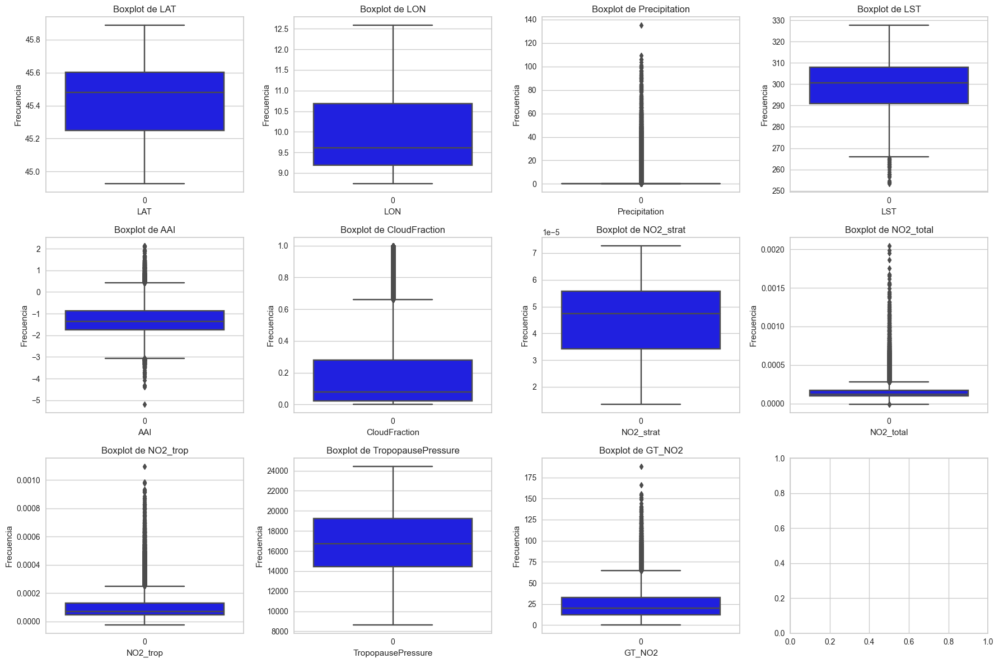

In [90]:
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(18, 12))
axes = axes.flatten()

# Generate boxplots for each numerical variable
for i, var in enumerate(train_numeric):
    sns.boxplot(train_numeric[var], color='blue', ax=axes[i])
    axes[i].set_title(f'Boxplot de {var}')
    axes[i].set_xlabel(var)
    axes[i].set_ylabel('Frecuencia')

# Hide any remaining empty subplots
if len(train_numeric) < len(axes):
    for j in range(len(train_numeric), len(axes)):
        axes[j].axis('off')  # This hides the axis completely


plt.tight_layout()
plt.savefig('Boxplot.png')
plt.show()



### KDE Plot
*NO2_total, No2_trop, CloudFraction y Precipitation tienen una asimetria hacia la izquierda. 

*TopopausePressure presenta varios grupos marcados, los picos podrían representar diferentes climas o diferentes presiones a lo largo de las estaciones del año.

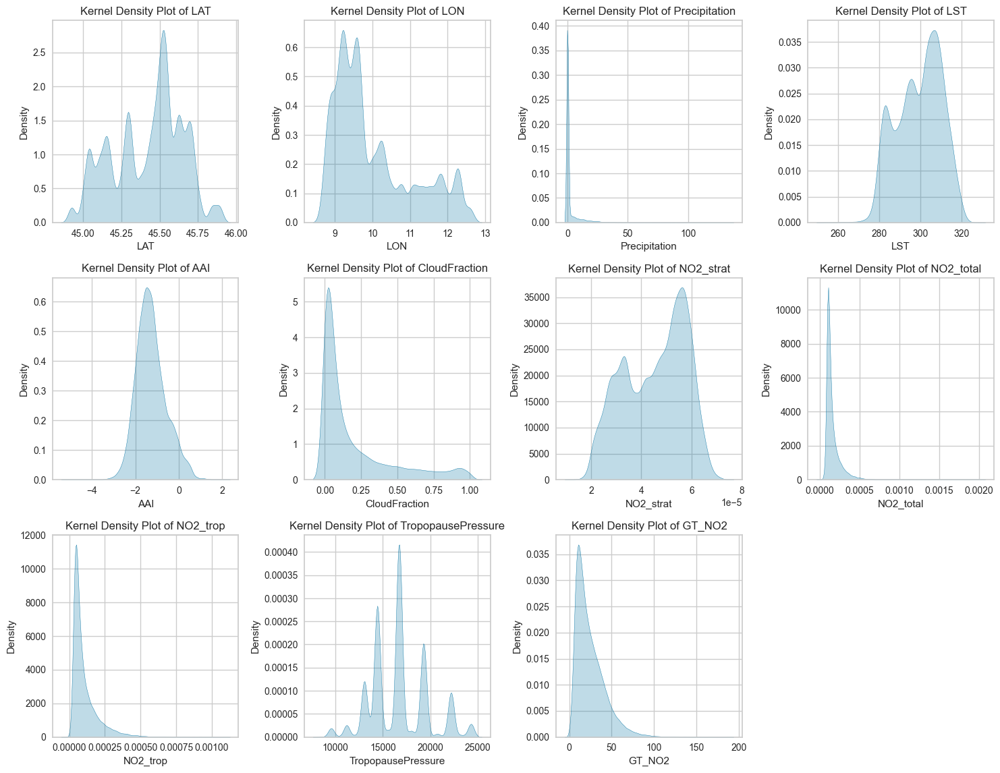

In [91]:

# Number of plots per row and column
n_rows, n_cols = 4, 4

# Create a figure with a 3x3 grid of subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 15))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Generate Kernel Density Plots for each numerical variable
for i, col in enumerate(train_numeric):
    sns.kdeplot(train_numeric[col], shade=True, ax=axes[i])
    axes[i].set_title(f'Kernel Density Plot of {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Density')

# Remove any empty subplots
for j in range(i + 1, n_rows * n_cols):
    fig.delaxes(axes[j])


# Adjust layout
plt.tight_layout()
plt.show()

### 3.4 Componente de tiempo. 

La mayoría de las variables tiene una componente estacional, se observa patrones definidos a lo largo del tiempo al rededor de los mismos meses.



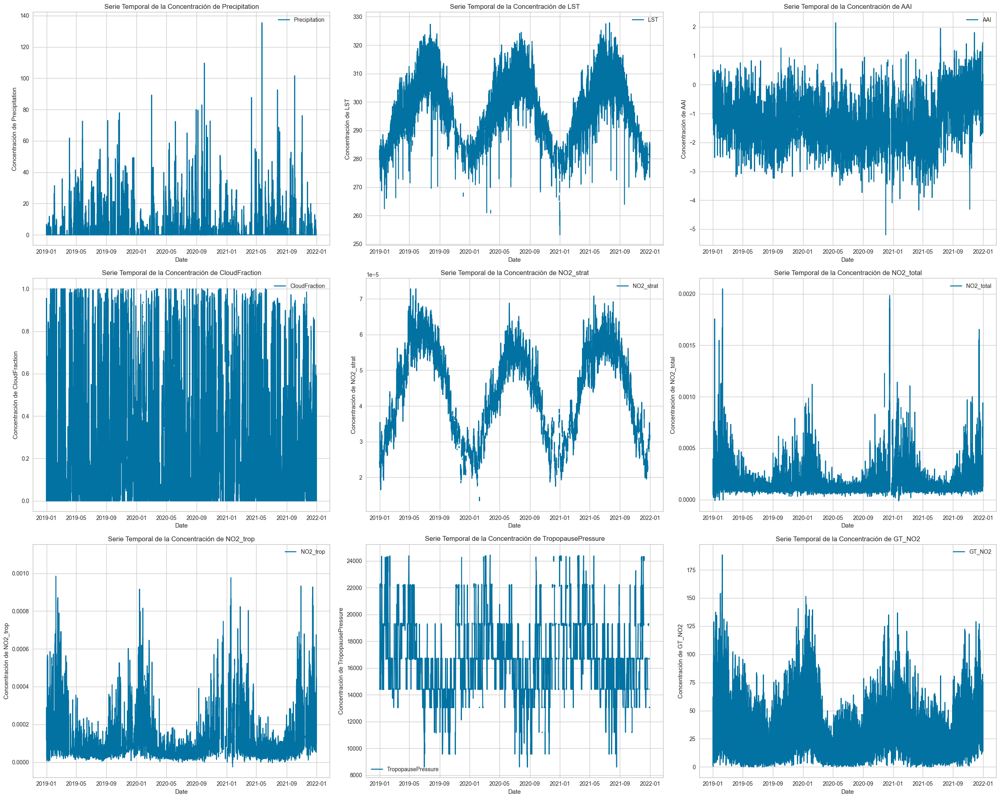

In [92]:
#Timeseries analisis

timeseries = train_numeric.drop(['LAT', 'LON'], axis=1)

#Uno Date a train_numeric dataset
train_numeric_with_date = timeseries.merge(train[['Date']], left_index=True, right_index=True, how='left')
train_numeric_with_date

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(25, 20))
axes = axes.flatten()

for i, var in enumerate(timeseries):
    axes[i].plot(train_numeric_with_date['Date'], train_numeric_with_date[var], label=var)
    axes[i].set_title(f'Serie Temporal de la Concentración de {var}')
    axes[i].set_xlabel('Date')
    axes[i].set_ylabel(f'Concentración de {var}')
    axes[i].legend()


# Esconder subplts vacios
for j in range(len(train_numeric), len(axes)):
    fig.delaxes(axes[j])


plt.tight_layout()
plt.show()


### 3.5 Analisis de correlaciones

- Analisis de correlacion que ya habiamos visto anteriormente con el pandas_progiling. Pero se detalla los valores en un grafico de barras horizontales para mejor apreciacion de las correlaciones con respecto a la variable objetivo GT_NO2.

- No2_strat, LST tienen una correlacion media negativa con respecto a la variable objetivo.
- No2_total y NO2_trop tienen correlacion fuerte positiva respecto a la variable objetivo.

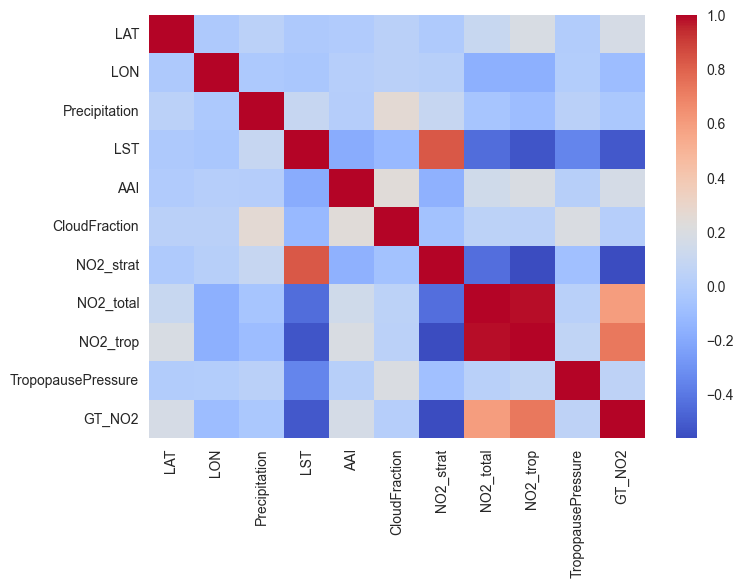

In [93]:
missing_correlation = train_numeric.corr()
sns.heatmap(missing_correlation, cmap='coolwarm')


plt.show()

<Axes: >

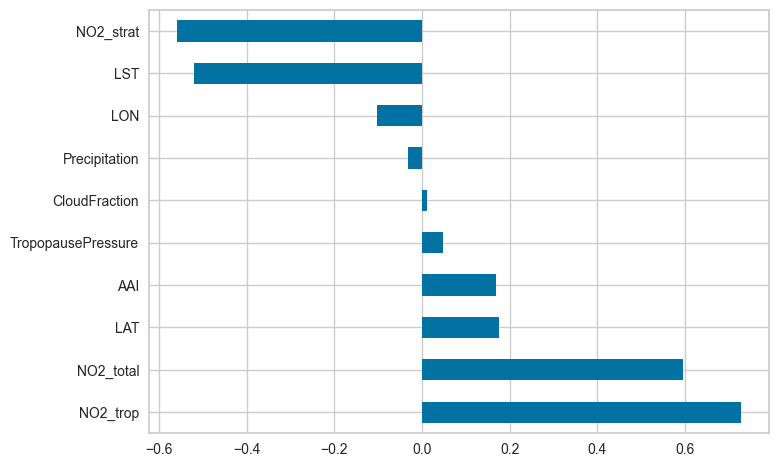

In [94]:
(missing_correlation
     .GT_NO2
     .drop('GT_NO2') # don't compare with myself
     .sort_values(ascending=False)
     .plot
     .barh())


### 3.7 Pair Plot

* Se aprecian relaciones lineales entre No2_total y No2 trop.
* Los mayores valores de GT_NO2 respecto a la variable AAI se aprecian alrededor de -1.
  

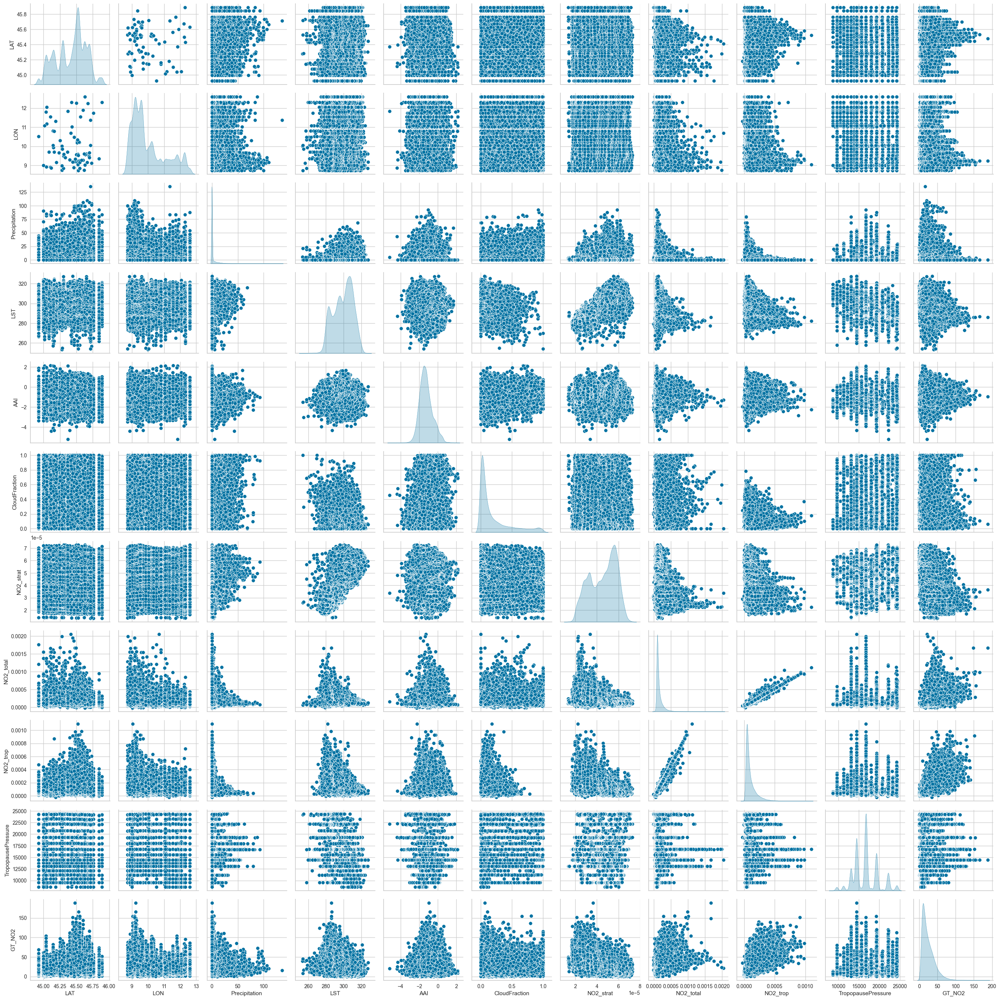

In [95]:
# Create a pairplot
sns.pairplot(train_numeric,diag_kind='kde')
plt.show()



#### Con el pair plot se logra observar la correlacion entre las variables NO2_total y NO2_trop, indicada en la matriz de correlacion. Se observa que es una correlación positiva, conforme aumenta el valor de una variable, aumenta el de la otra. Es importante evitar variables con correlaciones altas porque pueden introducir redundancia, dificultar la interpretación del modelo, aumentar el riesgo de sobreajuste y reducir la eficiencia computacional.

## 3.8 Geographical distribution

- No se aprecia nada puntual con respecto a la ubicación. Tienen valores bastante similares.

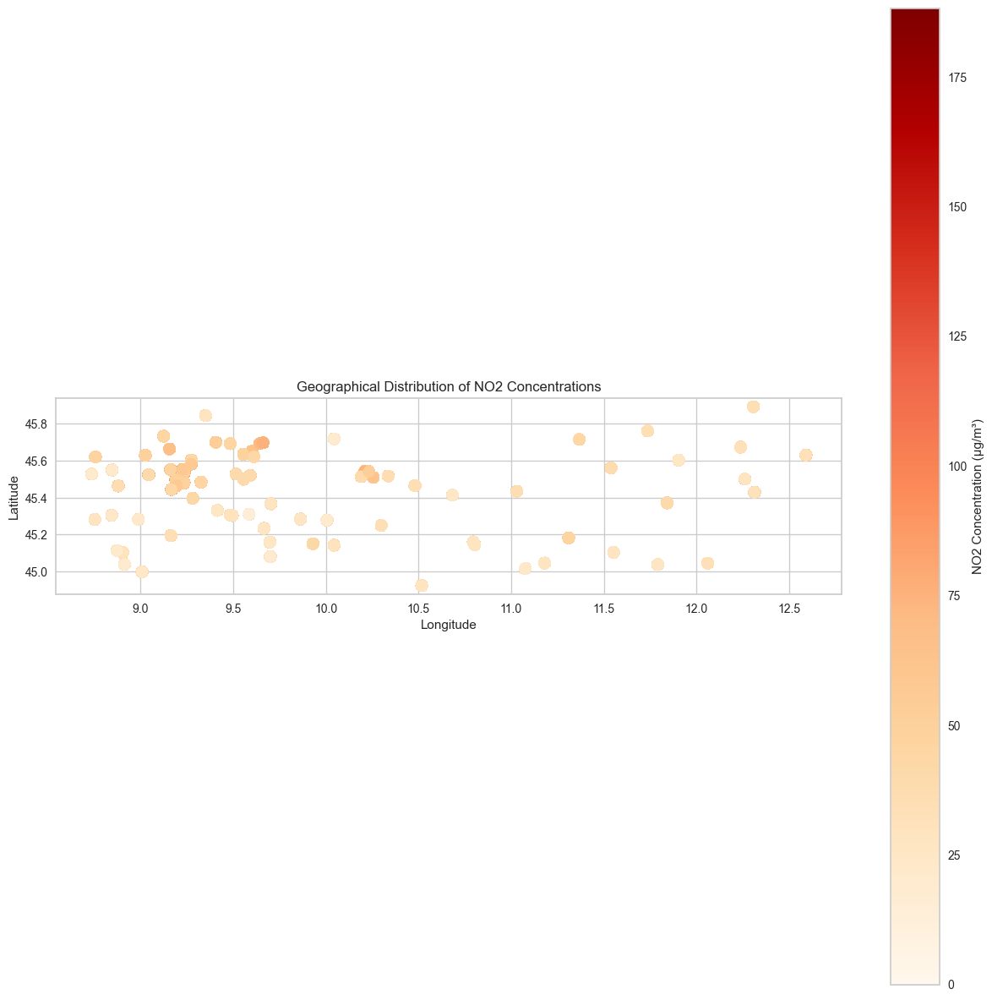

In [96]:

# Convert the DataFrame to a GeoDataFrame
geometry = [Point(xy) for xy in zip(train_numeric['LON'], train_numeric['LAT'])]
geo_data = gpd.GeoDataFrame(train_numeric, geometry=geometry)

# Plot the GeoDataFrame
fig, ax = plt.subplots(1, 1, figsize=(15, 15))
geo_data.plot(column='GT_NO2', ax=ax, legend=True, cmap='OrRd', markersize=100, legend_kwds={'label': "NO2 Concentration (µg/m³)"})

# Add title and labels
plt.title('Geographical Distribution of NO2 Concentrations')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Show the plot
plt.show()

# 4. Limpieza y preparación de la data

## 4.1 Separo month, date, year


In [129]:
#Uno Date a train_numeric dataset
train_numeric = train_numeric.merge(train[['Date']], left_index=True, right_index=True, how='left')

# Extraer informacion importante de datetime
train_numeric['Year'] = train_numeric['Date'].dt.year
train_numeric['Month'] = train_numeric['Date'].dt.month
train_numeric['Day'] = train_numeric['Date'].dt.day

#Eliminar date compuesta
train_numeric.drop('Date', axis=1,inplace=True)
train_numeric

,LAT,LON,Precipitation,LST,AAI,CloudFraction,NO2_strat,NO2_total,NO2_trop,TropopausePressure,GT_NO2,Year,Month,Day
ID_Zindi,,,,,,,,,,,,,,
ID_ENTGC7,45.601585,11.903551,0.000000,NaN,0.230527,0.559117,0.000024,0.000117,NaN,14440.82126,31.000,2019,1,1
ID_8JCCXC,45.371005,11.840830,3.047342,NaN,-0.074006,0.869309,0.000024,0.000127,NaN,14441.79815,42.000,2019,1,1
ID_V3136Z,45.045825,12.060869,0.000000,NaN,0.024470,0.674160,0.000024,0.000086,NaN,14437.38294,31.000,2019,1,1
ID_KRVZDJ,45.104075,11.553241,1.200467,NaN,-0.010442,0.920054,0.000024,0.000124,NaN,14440.83831,30.000,2019,1,1
ID_PR351A,45.038758,11.790152,1.274564,NaN,-0.176178,0.747464,0.000024,0.000116,NaN,14438.79037,58.000,2019,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ID_NCWXIY,45.498227,9.556232,0.000000,NaN,-0.434350,0.250490,0.000032,0.000643,NaN,13063.79770,39.750,2021,12,31
ID_UDQIEE,45.142541,10.043836,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30.125,2021,12,31
ID_ENDUPX,45.842207,9.351658,0.000000,284.98,-0.157753,0.000000,0.000031,0.000153,0.000122,13050.16499,28.325,2021,12,31


## 4.2 Tratamiento de missings

Como se menciona anteriormente, con pandas_profiling, se encuentra un gran porcentaje de valores missing. LST y NO2_trop tienen % de missings muy altos.
Imputar la variable objetivo puede ser problematico y no es recomendado en la literatura. Introduce bias en el modelo, por lo que se eliminan ese 5% de muestras que contienen GT_NO2 missing.

In [130]:
#Definicion para deteccion de missings

def missing_proport(df):
    df = df.apply(lambda x: x.isna().sum()/df.shape[0]*100)
    df = df.sort_values(ascending=False)
    return df

#Aplico formula
missing_proport(train_numeric)

LST                   45.950659
NO2_trop              40.969255
AAI                   14.870296
CloudFraction         14.870296
NO2_strat             14.870296
NO2_total             14.870296
TropopausePressure    14.870296
GT_NO2                 5.235499
LAT                    0.000000
LON                    0.000000
Precipitation          0.000000
Year                   0.000000
Month                  0.000000
Day                    0.000000
dtype: float64

In [131]:
# Drop rows where 'GT_NO2' is NaN
train_numeric.dropna(subset=['GT_NO2'], inplace=True)

#Verifico Nan otra vez
missing_proport(train_numeric)



LST                   45.817743
NO2_trop              40.741508
AAI                   14.769223
CloudFraction         14.769223
NO2_strat             14.769223
NO2_total             14.769223
TropopausePressure    14.769223
LAT                    0.000000
LON                    0.000000
Precipitation          0.000000
GT_NO2                 0.000000
Year                   0.000000
Month                  0.000000
Day                    0.000000
dtype: float64

Utilizar Imputador MICE para la imputacion de missings de las demas variables (No la objetivo). Utiliza una serie de modelos de regresión, iterando sobre cada característica con datos faltantes para imputarla en función de otras variables. De utilidad cuando son varias variables con valores faltantes. 

Se utilizó el estimator ExtraTreesRegressor en el proceso de imputación debido a su capacidad para capturar interacciones complejas en los datos y ser robusto frente a outliers

In [132]:
#Imputacion para missings de las otras variables 

# Features para ser imputados
features = ['LST', 'NO2_trop', 'AAI', 'CloudFraction', 'NO2_strat', 'NO2_total', 'TropopausePressure']

# Reset index antes de normalizar
train_numeric.reset_index(inplace=True)

# Normalizar la data para un mejor manejo.
scaler_missings = MinMaxScaler()
train_numeric_scaled = scaler_missings.fit_transform(train_numeric[features])  

# Convertir el array normalizado de vuelta a DataFrame 
train_numeric_scaled = pd.DataFrame(train_numeric_scaled, columns=features)

# Usar la data normalziada para la imputacion
imputer = IterativeImputer(estimator=BayesianRidge())
df_imputed = imputer.fit_transform(train_numeric_scaled)

# Convertir de vuelta a dataFrame
df_imputed = pd.DataFrame(df_imputed, columns=features)

# Transformar de vuelta a escala original
df_imputed_original_scale = pd.DataFrame(scaler_missings.inverse_transform(df_imputed), columns=features)

# Reemplazar con los valores imputados
train_numeric.loc[:, features] = df_imputed_original_scale

# 'ID_Zindi' back as index
train_numeric.set_index('ID_Zindi', inplace=True)

In [133]:

#Verifico NaN
missing_proport(train_numeric)

LAT                   0.0
LON                   0.0
Precipitation         0.0
LST                   0.0
AAI                   0.0
CloudFraction         0.0
NO2_strat             0.0
NO2_total             0.0
NO2_trop              0.0
TropopausePressure    0.0
GT_NO2                0.0
Year                  0.0
Month                 0.0
Day                   0.0
dtype: float64

# Tratamiento outliers

Se aplicó el metodo IQR para tratamiento de outliers. 

In [134]:
def iqr_outliers(df, column):
    """
    Identify outliers using the IQR method.
    
    Parameters:
    - df: pandas DataFrame
    - column: str, the name of the column to check for outliers
    
    Returns:
    - pandas Series, with outliers flagged as True
    """
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    outliers = (df[column] < lower_bound) | (df[column] > upper_bound)
    return outliers

# Apply IQR outlier detection to all numeric columns
numeric_columns = train_numeric.select_dtypes(include=[np.number]).columns
numeric_columns = numeric_columns.drop('GT_NO2')

for column in numeric_columns:
    outliers = iqr_outliers(train_numeric, column)
    # You can choose to either remove these outliers or handle them in some other way
    print(f"Outliers in {column}: {outliers.sum()} out of {len(train_numeric)}")

# For example, capping/flooring the outliers:
def cap_floor_outliers(df, column, lower_limit=0.01, upper_limit=0.99):
    lower_quantile = df[column].quantile(lower_limit)
    upper_quantile = df[column].quantile(upper_limit)
    
    capped_values = np.where(df[column] < lower_quantile, lower_quantile,
                             np.where(df[column] > upper_quantile, upper_quantile, df[column]))
    
    return capped_values

# Apply capping/flooring to all numeric columns

#Crear copia de train_numeric
train_numericoutliers=train_numeric.copy()

for column in train_numeric:
    train_numericoutliers[column] = cap_floor_outliers(train_numericoutliers, column)



Outliers in LAT: 0 out of 82049
Outliers in LON: 0 out of 82049
Outliers in Precipitation: 16832 out of 82049
Outliers in LST: 164 out of 82049
Outliers in AAI: 3750 out of 82049
Outliers in CloudFraction: 9705 out of 82049
Outliers in NO2_strat: 2 out of 82049
Outliers in NO2_total: 8463 out of 82049
Outliers in NO2_trop: 7796 out of 82049
Outliers in TropopausePressure: 8902 out of 82049
Outliers in Year: 0 out of 82049
Outliers in Month: 0 out of 82049
Outliers in Day: 0 out of 82049


# Busco mejor transformación para cada variable
Esto permite mejorar la relación entre las variables predictoras y el objetivo, aumentando la precisión

In [103]:

## Definción de función para encontrar mejor tranformación
def mejorTransf(vv, target, name=False, tipo='cramer', graf=False):
    # Escalado de datos (evitar fallos de tamaño de float64 al hacer exp de número grande..cosas de python)
    vv = pd.Series(scale(vv), name=vv.name)
    # Traslación a valores positivos de la variable (sino falla log y las raíces!)
    vv = vv + abs(min(vv)) + 0.0001
    
    # Definimos y calculamos las transformaciones típicas  
    transf = pd.DataFrame({
        vv.name + '_ident': vv,
        vv.name + '_log': np.log(vv),
        vv.name + '_exp': np.exp(vv),
        vv.name + '_sqrt': np.sqrt(vv),
        vv.name + '_sqr': np.square(vv),
        vv.name + '_cuarta': vv**4,
        vv.name + '_raiz4': vv**(1/4)
    })
    
    # Distinguimos caso cramer o caso correlación
    if tipo == 'cramer':
        # Aplicar la función cramers_v a cada transformación frente a la respuesta
        tablaCramer = pd.DataFrame(transf.apply(lambda x: cramers_v(x, target)), columns=['VCramer'])
        
        # Si queremos gráfico, muestra comparativa entre las posibilidades
        if graf:
            px.bar(tablaCramer, x=tablaCramer.VCramer, title='Relaciones frente a ' + target.name).update_yaxes(categoryorder="total ascending").show()
        
        # Identificar mejor transformación
        if not tablaCramer.empty:
            best = tablaCramer.query('VCramer == VCramer.max()').index
            if len(best) > 0:
                ser = transf[best[0]].squeeze()
            else:
                ser = vv  # Return original variable if no best transformation found
        else:
            ser = vv  # Return original variable if tablaCramer is empty
    
    if tipo == 'cor':
        # Aplicar coeficiente de correlación a cada transformación frente a la respuesta
        tablaCorr = pd.DataFrame(transf.apply(lambda x: np.corrcoef(x, target)[0, 1]), columns=['Corr'])
        
        # Si queremos gráfico, muestra comparativa entre las posibilidades
        if graf:
            px.bar(tablaCorr, x=tablaCorr.Corr, title='Relaciones frente a ' + target.name).update_yaxes(categoryorder="total ascending").show()
        
        # Identificar mejor transformación
        if not tablaCorr.empty:
            best = tablaCorr.query('Corr.abs() == Corr.abs().max()').index
            if len(best) > 0:
                ser = transf[best[0]].squeeze()
            else:
                ser = vv  # Return original variable if no best transformation found
        else:
            ser = vv  # Return original variable if tablaCorr is empty
    
    # Aquí distingue si se devuelve la variable transformada o solamente el nombre de la transformación
    if name:
        return ser.name if 'ser' in locals() else vv.name
    else:
        return ser if 'ser' in locals() else vv


In [104]:
#Defino variable objetivo 

varObj = train_numeric.GT_NO2

# Aplicar a las variables continuas la mejor transformación según correlacion frente a varObjCont
transf_cor = train_numericoutliers.apply(lambda x: mejorTransf(x,varObj, tipo='cor'))

# Pedir los nombres de las transformadas
transf_cor_names = train_numericoutliers.select_dtypes(include=np.number).apply(lambda x: mejorTransf(x,varObj,tipo='cor', name=True))

# Asignar nombres a las columnas de salida del proceso
transf_cor.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82049 entries, 0 to 82048
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   LAT                 82049 non-null  float64
 1   LON                 82049 non-null  float64
 2   Precipitation       82049 non-null  float64
 3   LST                 82049 non-null  float64
 4   AAI                 82049 non-null  float64
 5   CloudFraction       82049 non-null  float64
 6   NO2_strat           82049 non-null  float64
 7   NO2_total           82049 non-null  float64
 8   NO2_trop            82049 non-null  float64
 9   TropopausePressure  82049 non-null  float64
 10  GT_NO2              82049 non-null  float64
 11  Year                82049 non-null  float64
 12  Month               82049 non-null  float64
 13  Day                 82049 non-null  float64
dtypes: float64(14)
memory usage: 8.8 MB


### La mejor transformación es la misma función. No se aplica ninguna transformación a las variables.

# 4. MODELADO DE DATOS 

## 4.1 Normalizacion de datos.

In [135]:
#Normalizar data y target separados
x = train_numericoutliers.drop('GT_NO2', axis=1)
y = train_numericoutliers['GT_NO2']

# Normalizar toda la data para un mejor manejo.
scaler_train_x= MinMaxScaler()
scaler_train_y=MinMaxScaler()

#Normalizar features
X_scaled = scaler_train_x.fit_transform(x)

#Normalizar target
y_scaled = scaler_train_y.fit_transform(y.values.reshape(-1, 1))

# Fit and transform on the selected features
# Convert scaled data back to DataFrame
features_scaled = pd.DataFrame(X_scaled, columns=x.columns)

target_scaled=pd.DataFrame(y_scaled,columns=['GT_NO2'])

In [136]:
#Funcion para calcular metricas de modelos

def calculate_regression_metrics(y_real, y_pred):
    # Calculate and print Mean Absolute Error
    mae = mean_absolute_error(y_real, y_pred)
    print('- Mean Absolute Error (MAE):', mae)

    # Calculate and print Mean Squared Error
    mse = mean_squared_error(y_real, y_pred)
    print('- Mean Squared Error (MSE):', mse)

    # Calculate and print Root Mean Squared Error
    rmse = np.sqrt(mse)
    print('- Root Mean Squared Error (RMSE):', rmse)

    # Calculate and print R-squared
    r2 = r2_score(y_real, y_pred)
    print('- R-squared (R²):', r2)

## 4.2 Train/test

In [137]:
#Divido en train y test

X = features_scaled
y = target_scaled

X_train, X_test, y_train, y_test = train_test_split (X, 
                                                     y,
                                                     test_size = 0.2,
                                                     random_state = 32)

## 4.3 PYCARET PARA DETERMINAR MEJOR MODELO

In [108]:
from pycaret.regression import setup, compare_models

#Set up PyCaret
model_setup = setup(data=X, target=y)

#Entrenar modelos
best_model = compare_models()


,Description,Value
0,Session id,5757
1,Target,Day
2,Target type,Regression
3,Original data shape,"(82049, 13)"
4,Transformed data shape,"(82049, 13)"
5,Transformed train set shape,"(57434, 13)"
6,Transformed test set shape,"(24615, 13)"
7,Numeric features,12
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,0.0804,0.0211,0.1451,0.7556,0.1014,0.3820,1.4390
rf,Random Forest Regressor,0.0952,0.0237,0.1540,0.7248,0.1076,0.4559,5.3840
xgboost,Extreme Gradient Boosting,0.1447,0.0361,0.1901,0.5804,0.1329,0.6841,0.1010
dt,Decision Tree Regressor,0.0975,0.0445,0.2110,0.4830,0.1463,0.4346,0.1210
knn,K Neighbors Regressor,0.1472,0.0449,0.2118,0.4792,0.1471,0.6908,0.1060
lightgbm,Light Gradient Boosting Machine,0.1800,0.0483,0.2198,0.4394,0.1538,0.9058,0.3020
gbr,Gradient Boosting Regressor,0.2300,0.0726,0.2694,0.1577,0.1871,1.1798,2.0820
ada,AdaBoost Regressor,0.2501,0.0837,0.2894,0.0280,0.2005,1.2823,0.2520
br,Bayesian Ridge,0.2534,0.0857,0.2928,0.0052,0.2028,1.3031,0.0180
ridge,Ridge Regression,0.2534,0.0857,0.2928,0.0052,0.2028,1.3028,0.0160


# 5. Modelos

## 5.1 XGB

In [109]:
# Inicializar modelo de XGBoost con parámetros específicos
model_xgb = xgb.XGBRegressor(
    objective='reg:squarederror',  
    learning_rate=0.1,             
    max_depth=5,                   
    n_estimators=100).fit(X_train, y_train)  

# Realizar la predicción con los datos de prueba
XGB_pred = model_xgb.predict(X_test)

# Invertir la normalización de las predicciones para devolverlas a la escala original
XGB_pred = scaler_train_y.inverse_transform(XGB_pred.reshape(-1, 1))

# Remodelar y_test a 2D antes de invertir la normalización
y_test_original = scaler_train_y.inverse_transform(y_test.values.reshape(-1, 1))

# Calcular las métricas de regresión en la escala original
calculate_regression_metrics(y_test_original, XGB_pred)


- Mean Absolute Error (MAE): 6.006018367691799
- Mean Squared Error (MSE): 68.56479333642116
- Root Mean Squared Error (RMSE): 8.280386062039689
- R-squared (R²): 0.75081991646561


## 5.2 Extra Trees Regressor

In [110]:
# Inicializar modelo
etr_model = ExtraTreesRegressor(
    n_estimators=100, 
    random_state=42).fit(X_train, y_train)

# Realizar la predicción con los datos de prueba
etr_pred = etr_model.predict(X_test)

# Invertir la normalización de las predicciones para devolverlas a la escala original
etr_pred = scaler_train_y.inverse_transform(etr_pred.reshape(-1, 1))

# Remodelar y_test a 2D antes de invertir la normalización
y_test_original = scaler_train_y.inverse_transform(y_test.values.reshape(-1, 1))

# Calcular las métricas de regresión en la escala original
calculate_regression_metrics(y_test_original, etr_pred)

- Mean Absolute Error (MAE): 5.405888005283127
- Mean Squared Error (MSE): 56.665957991521694
- Root Mean Squared Error (RMSE): 7.527679455949336
- R-squared (R²): 0.7940629956163938


## 5.4 Random Forest

In [111]:
# Inicializar modelo
model_rf = RandomForestRegressor(
    n_estimators=100, 
    max_depth=5, 
    random_state=42).fit(X_train, y_train)

#Predicción
rand_forest_pred = model_rf.predict(X_test)

# Invertir la normalización de las predicciones para devolverlas a la escala original
rand_forest_pred = scaler_train_y.inverse_transform(rand_forest_pred.reshape(-1, 1))

# Remodelar y_test a 2D antes de invertir la normalización
y_test_original = scaler_train_y.inverse_transform(y_test.values.reshape(-1, 1))

# Calcular las métricas de regresión en la escala original
calculate_regression_metrics(y_test_original, rand_forest_pred)



- Mean Absolute Error (MAE): 8.102475935667204
- Mean Squared Error (MSE): 120.31343488012884
- Root Mean Squared Error (RMSE): 10.968748099948728
- R-squared (R²): 0.5627535606117713


## 5.5 Decision Tree

In [112]:

# Inicializar modelo
model_tree = DecisionTreeRegressor(
    max_depth=5).fit(X_train, y_train)

#Prediccion
dec_tree_pred = model_tree.predict(X_test)

# Invertir la normalización de las predicciones para devolverlas a la escala original
dec_tree_pred = scaler_train_y.inverse_transform(dec_tree_pred.reshape(-1, 1))

# Remodelar y_test a 2D antes de invertir la normalización
y_test_original = scaler_train_y.inverse_transform(y_test.values.reshape(-1, 1))

# Calcular las métricas de regresión en la escala original
calculate_regression_metrics(y_test_original, dec_tree_pred)


- Mean Absolute Error (MAE): 8.242595368227718
- Mean Squared Error (MSE): 124.9022919556353
- Root Mean Squared Error (RMSE): 11.175969396684804
- R-squared (R²): 0.5460766082903139


# 6. Tecnicas para mejorar modelo

### 6.1 Extra Tree Regressor con Validación cruzada
Validación cruzada para evaluar el desempeño en diferentes subconjuntos de los datos, reduce el riesgo de overfitting

In [115]:

# Inicializar modelo
etr_model = ExtraTreesRegressor(
    n_estimators=100, 
    random_state=42)

# Realizar validación cruzada
cv = KFold(n_splits=5, shuffle=True, random_state=42)
cv_scores = cross_val_score(etr_model, X_train, y_train, cv=cv, scoring='neg_mean_squared_error')

# Convertir las puntuaciones de MSE negativo a MSE positivo y luego a RMSE
cv_rmse_scores = np.sqrt(-cv_scores)
print(f"Puntuaciones de RMSE en Validación Cruzada: {cv_rmse_scores}")
print(f"RMSE Promedio: {cv_rmse_scores.mean()}")

# Ajustar el modelo en todo el conjunto de datos de entrenamiento después de la validación cruzada
etr_model.fit(X_train, y_train)

# Realizar predicciones en el conjunto de prueba
etr_pred = etr_model.predict(X_test)

# Invertir la normalización de las predicciones
etr_pred = scaler_train_y.inverse_transform(etr_pred.reshape(-1, 1))

# Invertir la normalización de los valores verdaderos del conjunto de prueba
y_test_original = scaler_train_y.inverse_transform(y_test)

# Calcular las métricas de regresión en la escala original
calculate_regression_metrics(y_test_original, etr_pred)

Puntuaciones de RMSE en Validación Cruzada: [0.09692637 0.09800576 0.09797212 0.097096   0.0965412 ]
RMSE Promedio: 0.09730828891380468
- Mean Absolute Error (MAE): 5.405888005283127
- Mean Squared Error (MSE): 56.665957991521694
- Root Mean Squared Error (RMSE): 7.527679455949336
- R-squared (R²): 0.7940629956163938


## 6.1 Tunning de ETR 
Busco hiperparametros que permitan mejorar ajuste del modelo

In [116]:
# Definir el modelo
etr = ExtraTreesRegressor(random_state=42)

# Definir los hyperparametros
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

# GridSearchCV
grid_search = GridSearchCV(estimator=etr, param_grid=param_grid, cv=5, n_jobs=-1, scoring='neg_mean_squared_error')

# Reshape y_train, y_test de ser necesario
y_train = np.ravel(y_train)
y_test = np.ravel(y_test)

# Fit GridSearchCV
grid_search.fit(X_train, y_train)

# Print mejores parametros y scroe
print(f"Best Parameters: {grid_search.best_params_}")
print(f"Best Score: {-grid_search.best_score_}")

Best Parameters: {'bootstrap': False, 'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 300}
Best Score: 0.009302621048174812


In [118]:
#Agrego hiperparametros al modelo

#Inicializar modelo
etr_tunned = ExtraTreesRegressor(
    n_estimators=300,
    bootstrap=False,
    max_depth= 30, 
    min_samples_leaf=1,
    min_samples_split=5,
    random_state=42).fit(X_train, y_train)

# Realizar validación cruzada
cv = KFold(n_splits=5, shuffle=True, random_state=42)
cv_scores = cross_val_score(etr_tunned, X_train, y_train, cv=cv, scoring='neg_mean_squared_error')

# Convertir las puntuaciones de MSE negativo a MSE positivo y luego a RMSE
cv_rmse_scores = np.sqrt(-cv_scores)
print(f"Puntuaciones de RMSE en Validación Cruzada (normalizado): {cv_rmse_scores}")
print(f"RMSE Promedio (Normalizado): {cv_rmse_scores.mean()}")

# Ajustar el modelo en todo el conjunto de datos de entrenamiento después de la validación cruzada
etr_tunned.fit(X_train, y_train)

# Realizar predicciones en el conjunto de prueba
etr_pred = etr_tunned.predict(X_test)

# Invertir la normalización de las predicciones
etr_pred = scaler_train_y.inverse_transform(etr_pred.reshape(-1, 1))

# Invertir la normalización de los valores verdaderos del conjunto de prueba
y_test_original = scaler_train_y.inverse_transform(y_test.reshape(-1, 1))

# Calcular las métricas de regresión en la escala original
calculate_regression_metrics(y_test_original, etr_pred)


Puntuaciones de RMSE en Validación Cruzada (normalizado): [0.09587721 0.0972971  0.09747166 0.09622014 0.09565425]
RMSE Promedio (Normalizado): 0.0965040739601254
- Mean Absolute Error (MAE): 5.369666311247146
- Mean Squared Error (MSE): 55.51723532967755
- Root Mean Squared Error (RMSE): 7.4509888826703765
- R-squared (R²): 0.7982377155405349


# 6.4 Verifico importancia de variables de ETR

               Feature  Importance
8             NO2_trop    0.222963
7            NO2_total    0.152789
0                  LAT    0.110895
11               Month    0.106095
6            NO2_strat    0.097798
1                  LON    0.090353
3                  LST    0.047630
12                 Day    0.044465
10                Year    0.032420
5        CloudFraction    0.030928
9   TropopausePressure    0.021844
4                  AAI    0.021588
2        Precipitation    0.020232


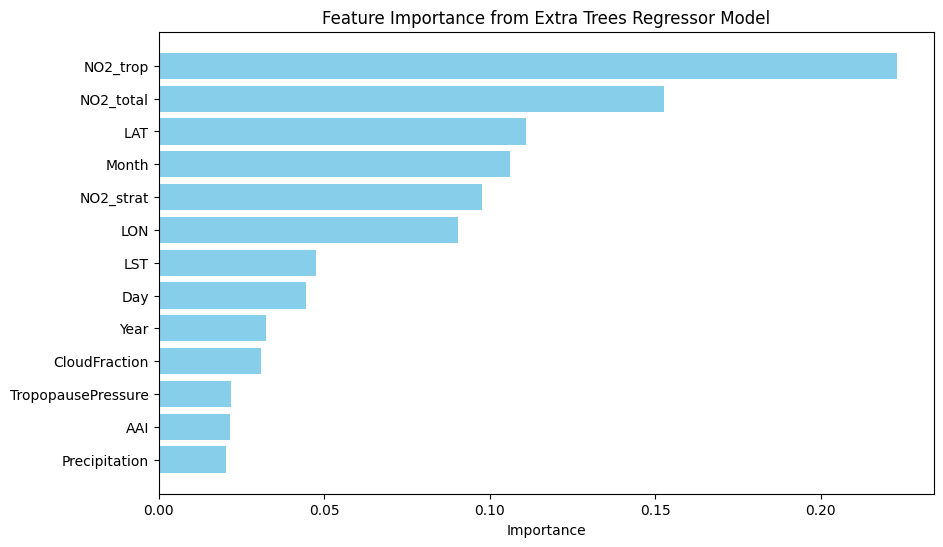

In [66]:
# Obtener importancia
importances = etr_tunned.feature_importances_

# Crear DataFrame para visualizacion
import pandas as pd
importances_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Print importancia
print(importances_df)

# Plot
plt.figure(figsize=(10, 6))
plt.barh(importances_df['Feature'], importances_df['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.title('Feature Importance from Extra Trees Regressor Model')
plt.gca().invert_yaxis()  
plt.show()

De los plots se observa como LST, AAI, CloudFraction y Day tienen uy poca influencia en la variable objetivo. Un cambio en estos parametros no impacta en la dependencia

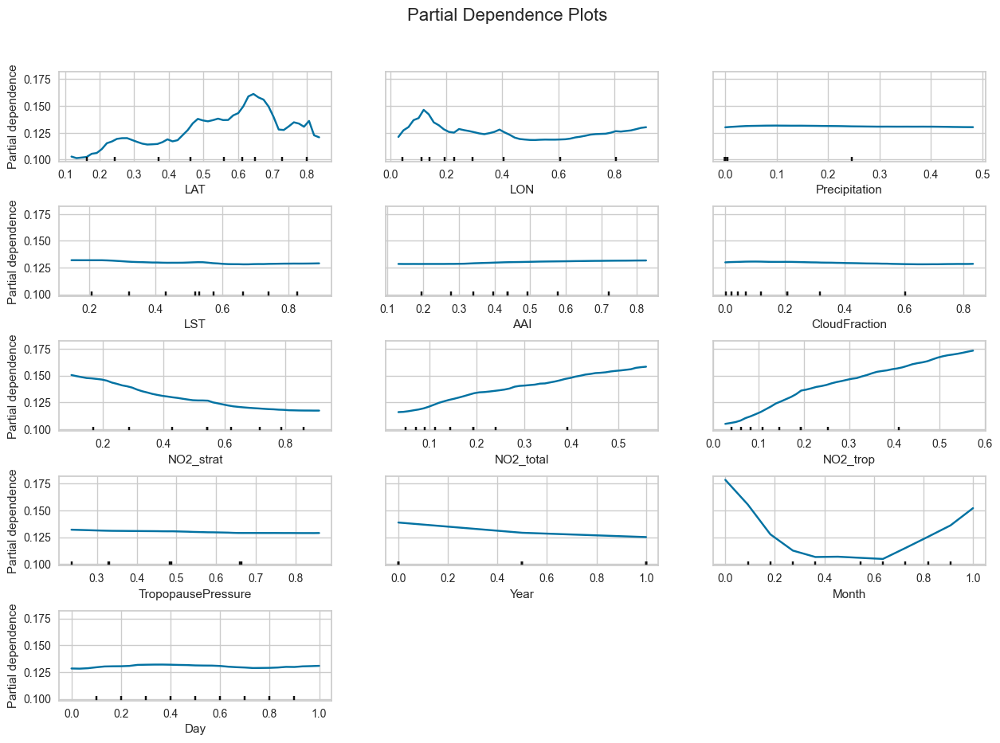

In [149]:
#Partial Dependence Plots

# Especificar los índices de las características que deseas visualizar
features = list(range(X_train.shape[1]))  # Índices de todas las características en X_train

# Crear Partial Dependence Plots para todas las características
fig, ax = plt.subplots(figsize=(15, 10))
display = PartialDependenceDisplay.from_estimator(etr_tunned, X_train, features, grid_resolution=50, ax=ax)

# Personalizar el gráfico
plt.suptitle('Partial Dependence Plots', fontsize=16)
plt.subplots_adjust(hspace=0.5, top=0.9) # Ajustar para que el título no se superponga
plt.show()

In [153]:
#Inspeccionar resultados basados en variables presentes
def calculate_regression_metrics_modified(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    print(f"MSE: {mse}")
    return mse

# Definir las variables a probar
variables_to_check = ['Precipitation', 'LST', 'AAI','CloudFraction','TropopausePressure','Year','Day','NO2_trop','NO2_total']  # reemplaza con las variables que quieras probar

# Crear combinaciones de variables para eliminar
combinations = sum([list(itertools.combinations(variables_to_check, i)) for i in range(len(variables_to_check) + 1)], [])

# Inicializar variables para rastrear el mejor rendimiento
best_mse = float("inf")
best_combination = None

# Iterar sobre cada combinación de variables para eliminar
for combination in combinations:
    print(f"Evaluando combinación: {combination}")
    X_with_importance = features_scaled.drop(columns=list(combination))
    
    X_train_imp, X_test_imp, y_train, y_test = train_test_split(X_with_importance, y, test_size=0.2, random_state=32)

    # Inicializo modelo
    etr_with_importance = ExtraTreesRegressor(
    n_estimators=300,
    bootstrap=False,
    max_depth= None, 
    min_samples_leaf=1,
    min_samples_split=5,
    random_state=42).fit(X_train_imp, y_train)

    #Prediccion
    etr_pred = etr_with_importance.predict(X_test_imp)

    # Métricas 
    mse = calculate_regression_metrics_modified(y_test, etr_pred)
    
    # Actualizar la mejor combinación si se encuentra un mejor MSE
    if mse < best_mse:
        best_mse = mse
        best_combination = combination

print(f"\nLa mejor combinación de variables para eliminar es: {best_combination} con un MSE de: {best_mse}")

Evaluando combinación: ()
MSE: 0.001710798560239363
Evaluando combinación: ('Precipitation',)
MSE: 0.0017163701252516214
Evaluando combinación: ('LST',)
MSE: 0.00169427902656036
Evaluando combinación: ('AAI',)
MSE: 0.0017041602865189621
Evaluando combinación: ('CloudFraction',)
MSE: 0.0016911035290114087
Evaluando combinación: ('TropopausePressure',)
MSE: 0.0017178149567215145
Evaluando combinación: ('Year',)
MSE: 0.00190813277376611
Evaluando combinación: ('Day',)
MSE: 0.001971594774190272
Evaluando combinación: ('NO2_trop',)
MSE: 0.0016713820819565896
Evaluando combinación: ('NO2_total',)
MSE: 0.0016683676796807898
Evaluando combinación: ('Precipitation', 'LST')
MSE: 0.001685760062280268
Evaluando combinación: ('Precipitation', 'AAI')
MSE: 0.001695299830411942
Evaluando combinación: ('Precipitation', 'CloudFraction')
MSE: 0.001673084926773359
Evaluando combinación: ('Precipitation', 'TropopausePressure')
MSE: 0.0017176562993297978
Evaluando combinación: ('Precipitation', 'Year')
MSE:

### 6.4.1 Drop Variables no importantes
Eliminar variables no importantes para reducir la dimensionalidad y mejorar la eficiencia del modelo. Obtengo un modelo mas sencillo

In [392]:
#Drop variables que parece no tener importancia
X_with_imp = train_numericoutliers.drop(columns=['Precipitation', 'LST', 'AAI', 'NO2_trop', 'NO2_total','CloudFraction','GT_NO2'])



In [393]:
#Normalizar data y target separados
X = X_with_imp
y = train_numeric['GT_NO2']

# Normalizar toda la data para un mejor manejo.
scaler_imp_x= MinMaxScaler()
scaler_imp_y=MinMaxScaler()

#Normalizar features
X_scaled_imp = scaler_imp_x.fit_transform(X)

#Normalizar target
y_scaled_imp = scaler_imp_y.fit_transform(y.values.reshape(-1, 1))

# Fit and transform on the selected features
# Convert scaled data back to DataFrame
features_scaled_imp= pd.DataFrame(X_scaled_imp, columns=X.columns)

target_scaled_imp=pd.DataFrame(y_scaled_imp,columns=['GT_NO2'])

In [394]:
X_imp = features_scaled_imp
y_imp = target_scaled_imp

# Divido en training y test con nuevas X, y mantiene igual 
X_train_imp, X_test_imp, y_train, y_test = train_test_split (X_imp, 
                                                     y_imp,
                                                     test_size = 0.2,
                                                     random_state = 32)

In [395]:
#Pruebo modelo con variables que muestran importancia

# Inicializar modelo
etr_model_importance = ExtraTreesRegressor(
    n_estimators=300,
    bootstrap=False,
    max_depth= None, 
    min_samples_leaf=1,
    min_samples_split=5,
    random_state=42).fit(X_train_imp, y_train)

# Realizar validación cruzada
cv = KFold(n_splits=5, shuffle=True, random_state=42)
cv_scores = cross_val_score(etr_model_importance, X_train, y_train, cv=cv, scoring='neg_mean_squared_error')

# Convertir las puntuaciones de MSE negativo a MSE positivo y luego a RMSE
cv_rmse_scores = np.sqrt(-cv_scores)
print(f"Puntuaciones de RMSE en Validación Cruzada (normalizado): {cv_rmse_scores}")
print(f"RMSE Promedio (Normalizado): {cv_rmse_scores.mean()}")

# Ajustar el modelo en todo el conjunto de datos de entrenamiento después de la validación cruzada
etr_model_importance.fit(X_train_imp, y_train)

# Realizar predicciones en el conjunto de prueba
etr_pred_imp= etr_model_importance.predict(X_test_imp)

# Invertir la normalización de las predicciones
etr_pred_imp = scaler_imp_y.inverse_transform(etr_pred_imp.reshape(-1, 1))

# Invertir la normalización de los valores verdaderos del conjunto de prueba
y_test_original = scaler_imp_y.inverse_transform(y_test.values.reshape(-1, 1))

# Calcular las métricas de regresión en la escala original
calculate_regression_metrics(y_test_original, etr_pred_imp)

Puntuaciones de RMSE en Validación Cruzada (normalizado): [0.0414163  0.04207507 0.04220994 0.04123511 0.04149749]
RMSE Promedio (Normalizado): 0.041686783478756775
- Mean Absolute Error (MAE): 5.009506538469307
- Mean Squared Error (MSE): 50.05443096781214
- Root Mean Squared Error (RMSE): 7.0749156155965665
- R-squared (R²): 0.8320002668261246


## 6.5 Mejorar modelo con Bagging

Bagging mejora la precisión y la robustez del modelo al reducir la varianza, con la combinación de predicciones de varios modelos entrenados en subconjuntos aleatorios del dataset original, disminuye el riesgo de overfitting.

In [274]:
base_model = ExtraTreesRegressor(n_estimators=100, random_state=42)

In [275]:

bagging_model = BaggingRegressor(base_model, 
                                 n_estimators=10, # Number of base models
                                 random_state=42,
                                 n_jobs=-1) 

In [276]:
# Train the model
bagging_model.fit(X_train_imp, y_train)

# Make predictions
y_pred = bagging_model.predict(X_test_imp)


In [277]:
# Invertir la normalización de las predicciones para devolverlas a la escala original
y_pred = scaler_imp_y.inverse_transform(y_pred.reshape(-1, 1))

# Remodelar y_test a 2D antes de invertir la normalización
y_test_original = scaler_imp_y.inverse_transform(y_test.values.reshape(-1, 1))

# Calcular las métricas de regresión en la escala original
calculate_regression_metrics(y_test_original, y_pred)

- Mean Absolute Error (MAE): 5.101125726183343
- Mean Squared Error (MSE): 51.95073714391051
- Root Mean Squared Error (RMSE): 7.207685977060218
- R-squared (R²): 0.8256356168752469


### El método de bagging no mejoró el modelo.

# 6.6 Intento modelo sin corrección de outliers

In [138]:
#Normalizar data y target separados
X = train_numeric.drop('GT_NO2', axis=1)
y = train_numeric['GT_NO2']

# Normalizar toda la data para un mejor manejo.
scaler_out_x= MinMaxScaler()
scaler_out_y=MinMaxScaler()

#Normalizar features
X_scaled_out = scaler_out_x.fit_transform(X)

#Normalizar target
y_scaled_out = scaler_out_y.fit_transform(y.values.reshape(-1, 1))

# Fit and transform on the selected features
# Convert scaled data back to DataFrame
features_scaled_sinoutlier= pd.DataFrame(X_scaled_out, columns=X.columns)
target_scaled_sinoutlier=pd.DataFrame(y_scaled_out,columns=['GT_NO2'])

In [139]:
X_out = features_scaled_sinoutlier
y_out = target_scaled_sinoutlier

# Divido en training y test con nuevas X, y mantiene igual 
X_train_out, X_test_out, y_train, y_test = train_test_split (X_out, 
                                                     y_out,
                                                     test_size = 0.2,
                                                     random_state = 32)

In [55]:
#Set up PyCaret
model_setup = setup(data=X_out, target=y_out)

#Entrenar modelos
best_model = compare_models()


,Description,Value
0,Session id,8947
1,Target,Day
2,Target type,Regression
3,Original data shape,"(82049, 14)"
4,Transformed data shape,"(82049, 14)"
5,Transformed train set shape,"(57434, 14)"
6,Transformed test set shape,"(24615, 14)"
7,Numeric features,13
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,0.0785,0.0187,0.1369,0.7817,0.0960,0.3682,1.5660
rf,Random Forest Regressor,0.0946,0.0220,0.1482,0.7443,0.1039,0.4532,6.4990
xgboost,Extreme Gradient Boosting,0.1450,0.0360,0.1898,0.5804,0.1328,0.6895,0.1090
dt,Decision Tree Regressor,0.1017,0.0476,0.2181,0.4461,0.1516,0.4324,0.1460
lightgbm,Light Gradient Boosting Machine,0.1804,0.0484,0.2200,0.4361,0.1541,0.9073,0.2860
knn,K Neighbors Regressor,0.1614,0.0492,0.2219,0.4266,0.1543,0.7697,0.0830
gbr,Gradient Boosting Regressor,0.2326,0.0740,0.2721,0.1379,0.1890,1.1937,2.3500
ada,AdaBoost Regressor,0.2501,0.0837,0.2893,0.0253,0.2006,1.2827,0.2760
br,Bayesian Ridge,0.2526,0.0854,0.2922,0.0060,0.2025,1.2960,0.0160
ridge,Ridge Regression,0.2526,0.0854,0.2922,0.0060,0.2025,1.2955,0.0170


### 6.6.1 Tunning de hiperparametros

In [140]:
# Definir el modelo
etr = ExtraTreesRegressor(random_state=42)

# Definir los hyperparametros
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

# GridSearchCV
grid_search = GridSearchCV(estimator=etr, param_grid=param_grid, cv=5, n_jobs=-1, scoring='neg_mean_squared_error')

# Reshape y_train, y_test de ser necesario
y_train = np.ravel(y_train)
y_test = np.ravel(y_test)

# Fit GridSearchCV
grid_search.fit(X_train_out, y_train)

# Print mejores parametros y scroe
print(f"Best Parameters: {grid_search.best_params_}")
print(f"Best Score: {-grid_search.best_score_}")

Best Parameters: {'bootstrap': False, 'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 300}
Best Score: 0.0016674871374936114


In [143]:
#Pruebo modelo
# Inicializar modelo
etr_model_outliers = ExtraTreesRegressor(
    n_estimators=300,
    bootstrap=False,
    max_depth= 30, 
    min_samples_leaf=1,
    min_samples_split=5,
    random_state=42).fit(X_train_out, y_train)

# Realizar validación cruzada
cv = KFold(n_splits=5, shuffle=True, random_state=42)
cv_scores = cross_val_score(etr_model_outliers, X_train_out, y_train, cv=cv, scoring='neg_mean_squared_error')

# Convertir las puntuaciones de MSE negativo a MSE positivo y luego a RMSE
cv_rmse_scores = np.sqrt(-cv_scores)
print(f"Puntuaciones de RMSE en Validación Cruzada (normalizado): {cv_rmse_scores}")
print(f"RMSE Promedio (Normalizado): {cv_rmse_scores.mean()}")

# Ajustar el modelo en todo el conjunto de datos de entrenamiento después de la validación cruzada
etr_model_outliers.fit(X_train_out, y_train)

# Realizar predicciones en el conjunto de prueba
etr_pred_out= etr_model_outliers.predict(X_test_out)

# Invertir la normalización de las predicciones
etr_pred_out = scaler_out_y.inverse_transform(etr_pred_out.reshape(-1, 1))

# Invertir la normalización de los valores verdaderos del conjunto de prueba
y_test_original = scaler_out_y.inverse_transform(y_test.reshape(-1, 1))

# Calcular las métricas de regresión en la escala original
calculate_regression_metrics(y_test_original, etr_pred_out)

Puntuaciones de RMSE en Validación Cruzada (normalizado): [0.04047413 0.04126437 0.04146651 0.04034064 0.04050344]
RMSE Promedio (Normalizado): 0.04080981616631439
- Mean Absolute Error (MAE): 5.358193108115963
- Mean Squared Error (MSE): 57.76301436303403
- Root Mean Squared Error (RMSE): 7.600198310770189
- R-squared (R²): 0.8061276332049647


### 6.6.2 Selecionar variables importantes

               Feature  Importance
11               Month    0.180110
8             NO2_trop    0.144976
0                  LAT    0.122818
6            NO2_strat    0.122488
7            NO2_total    0.113375
1                  LON    0.094282
3                  LST    0.050437
12                 Day    0.045819
10                Year    0.033810
5        CloudFraction    0.029174
9   TropopausePressure    0.022374
4                  AAI    0.020861
2        Precipitation    0.019475


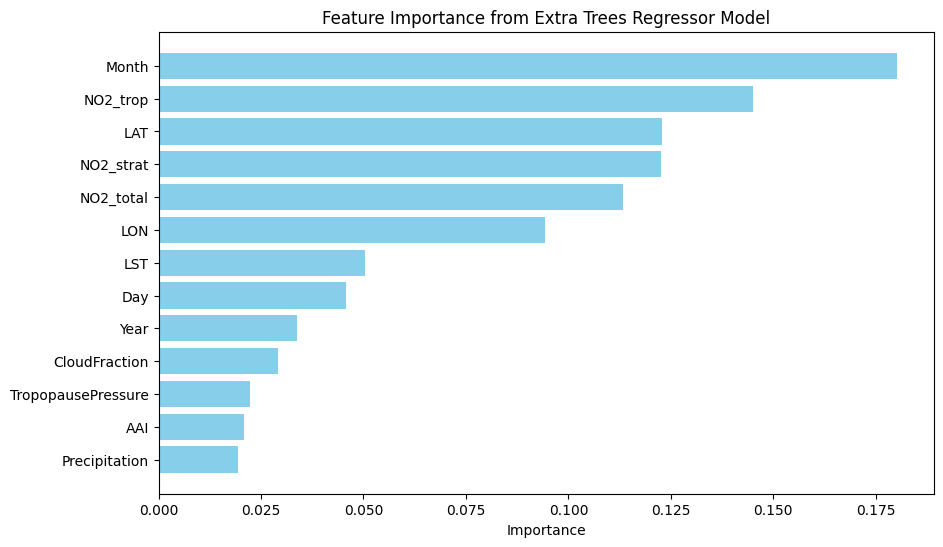

In [22]:
# Obtener importancia
importances = etr_model_outliers.feature_importances_

# Crear DataFrame para visualizacion
import pandas as pd
importances_df = pd.DataFrame({
    'Feature': X_train_out.columns,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Print importancia
print(importances_df)

# Plot
plt.figure(figsize=(10, 6))
plt.barh(importances_df['Feature'], importances_df['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.title('Feature Importance from Extra Trees Regressor Model')
plt.gca().invert_yaxis()  
plt.show()

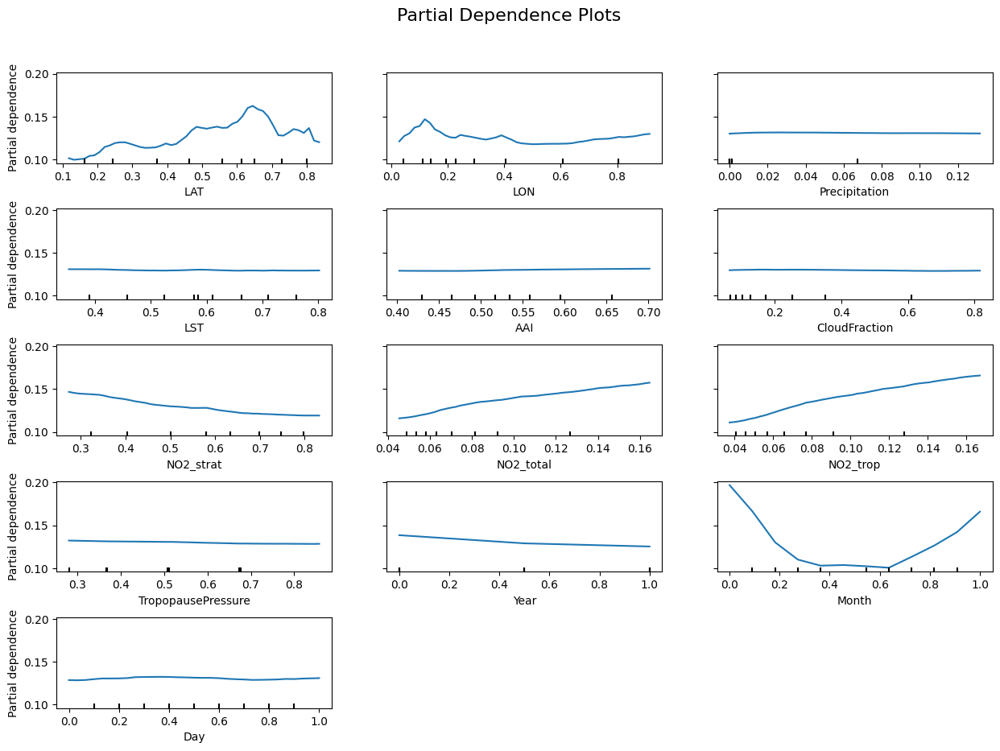

In [23]:
#Partial Dependence Plots

# Especificar los índices de las características que deseas visualizar
features = list(range(X_train_out.shape[1]))  # Índices de todas las características en X_train

# Crear Partial Dependence Plots para todas las características
fig, ax = plt.subplots(figsize=(15, 10))
display = PartialDependenceDisplay.from_estimator(etr_model_outliers, X_train_out, features, grid_resolution=50, ax=ax)

# Personalizar el gráfico
plt.suptitle('Partial Dependence Plots', fontsize=16)
plt.subplots_adjust(hspace=0.5, top=0.9) # Ajustar para que el título no se superponga
plt.show()

In [146]:
#Drop variables que parece no tener importancia
X_out_imp = X_out.drop(columns=['Precipitation', 'LST', 'AAI', 'NO2_trop', 'NO2_total','CloudFraction'])

In [147]:
# Divido en training y test con nuevas X, y mantiene igual 
X_train_out, X_test_out, y_train, y_test = train_test_split (X_out_imp, 
                                                     y_out,
                                                     test_size = 0.2,
                                                     random_state = 32)

In [149]:
#Pruebo modelo
# Inicializar modelo
etr_model_outliers = ExtraTreesRegressor(
    n_estimators=300,
    bootstrap=False,
    max_depth= 30, 
    min_samples_leaf=1,
    min_samples_split=5,
    random_state=42).fit(X_train_out, y_train)

# Realizar validación cruzada
cv = KFold(n_splits=5, shuffle=True, random_state=42)
cv_scores = cross_val_score(etr_model_outliers, X_train_out, y_train, cv=cv, scoring='neg_mean_squared_error')

# Convertir las puntuaciones de MSE negativo a MSE positivo y luego a RMSE
cv_rmse_scores = np.sqrt(-cv_scores)
print(f"Puntuaciones de RMSE en Validación Cruzada (normalizado): {cv_rmse_scores}")
print(f"RMSE Promedio (Normalizado): {cv_rmse_scores.mean()}")

# Ajustar el modelo en todo el conjunto de datos de entrenamiento después de la validación cruzada
etr_model_outliers.fit(X_train_out, y_train)

# Realizar predicciones en el conjunto de prueba
etr_pred_out= etr_model_outliers.predict(X_test_out)

# Invertir la normalización de las predicciones
etr_pred_out = scaler_out_y.inverse_transform(etr_pred_out.reshape(-1, 1))

# Invertir la normalización de los valores verdaderos del conjunto de prueba
y_test_original = scaler_out_y.inverse_transform(y_test.values.reshape(-1, 1))

# Calcular las métricas de regresión en la escala original
calculate_regression_metrics(y_test_original, etr_pred_out)

Puntuaciones de RMSE en Validación Cruzada (normalizado): [0.03800033 0.03874696 0.03858784 0.03819873 0.03842396]
RMSE Promedio (Normalizado): 0.038391562521174
- Mean Absolute Error (MAE): 4.988491488224833
- Mean Squared Error (MSE): 49.696325881904265
- Root Mean Squared Error (RMSE): 7.049562105684598
- R-squared (R²): 0.8332021895673785


### Modelo sin corrección de outliers tiene mejor rendimiento. Modelos tree based tienen menos afectación por outiers

# 6.7 Neural Network
Intento con modelos de redes neuronales para ver si sus resultados superan los de los modelos evaluados anteriormente

In [324]:
# Función para construir el modelo utilizando hiperparámetros fijos
def build_model(hp):
    model = Sequential()
    
    # Extraer los hiperparámetros
    units = hp.get('units')  # Número de unidades en cada capa oculta
    dropout = hp.get('dropout')  # Tasa de abandono (dropout) para la regularización
    num_layers = hp.get('num_layers')  # Número de capas ocultas
    
    # Capa de entrada
    model.add(Dense(units=units, activation='relu', input_shape=(X_train.shape[1],)))
    model.add(Dropout(dropout))
    
    # Capas ocultas
    for i in range(num_layers):
        model.add(Dense(units=units, activation='relu'))
        model.add(Dropout(dropout))
    
    # Capa de salida para regresión
    model.add(Dense(1, activation='linear'))
    
    # Compilar el modelo con la mejor tasa de aprendizaje encontrada
    learning_rate = hp.get('learning_rate')
    model.compile(optimizer=Adam(learning_rate=learning_rate), loss='mse', metrics=['mae'])
    
    return model


# Configurar Keras Tuner para buscar los mejores hiperparámetros
tuner = Hyperband(
    build_model,
    objective='val_loss',  
    max_epochs=30,  
    factor=3,  
    directory='my_dir', 
    project_name='my_project' 
)

Reloading Tuner from my_dir/my_project/tuner0.json


In [325]:
# Callback para detener el entrenamiento de manera anticipada si no hay mejora en la pérdida de validación
early_stopping = EarlyStopping(monitor='val_loss', patience=5)

# Buscar los mejores hiperparámetros utilizando Keras Tuner
tuner.search(X_train, y_train, epochs=50, validation_split=0.2, callbacks=[early_stopping])

# Obtener los mejores hiperparámetros encontrados
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

# Definir el modelo utilizando los mejores hiperparámetros encontrados
final_model = tuner.hypermodel.build(best_hps)

# Compilar el modelo con la tasa de aprendizaje óptima encontrada
final_model.compile(optimizer=Adam(learning_rate=best_hps.get('learning_rate')), loss='mse')

In [326]:
# Crear un wrap para el modelo Keras, permite usarlo con scikitlearn
wrapped_model = KerasRegressor(build_fn=create_model, epochs=50, validation_split=0.2, callbacks=[early_stopping])

# Configurar la validación cruzada
kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Realizar la validación cruzada y calcular el rendimiento del modelo
results_complete = cross_val_score(wrapped_model, X_train, y_train, cv=kfold, scoring='neg_mean_squared_error')

# Mostrar los resultados
print(f"Mean MSE: {-results_complete.mean()}, Standard Deviation: {results_complete.std()}")


Epoch 1/50
1313/1313 ━━━━━━━━━━━━━━━━━━━━ 1s 325us/step - loss: 0.0050 - mae: 0.0514 - val_loss: 0.0037 - val_mae: 0.0443
Epoch 2/50
1313/1313 ━━━━━━━━━━━━━━━━━━━━ 0s 285us/step - loss: 0.0039 - mae: 0.0446 - val_loss: 0.0037 - val_mae: 0.0449
Epoch 3/50
1313/1313 ━━━━━━━━━━━━━━━━━━━━ 0s 293us/step - loss: 0.0037 - mae: 0.0437 - val_loss: 0.0036 - val_mae: 0.0422
Epoch 4/50
1313/1313 ━━━━━━━━━━━━━━━━━━━━ 0s 287us/step - loss: 0.0036 - mae: 0.0430 - val_loss: 0.0036 - val_mae: 0.0444
Epoch 5/50
1313/1313 ━━━━━━━━━━━━━━━━━━━━ 0s 289us/step - loss: 0.0034 - mae: 0.0421 - val_loss: 0.0034 - val_mae: 0.0417
Epoch 6/50
1313/1313 ━━━━━━━━━━━━━━━━━━━━ 0s 293us/step - loss: 0.0035 - mae: 0.0421 - val_loss: 0.0032 - val_mae: 0.0416
Epoch 7/50
1313/1313 ━━━━━━━━━━━━━━━━━━━━ 0s 293us/step - loss: 0.0033 - mae: 0.0413 - val_loss: 0.0031 - val_mae: 0.0399
Epoch 8/50
1313/1313 ━━━━━━━━━━━━━━━━━━━━ 0s 307us/step - loss: 0.0032 - mae: 0.0406 - val_loss: 0.0031 - val_mae: 0.0400
Epoch 9/50
1313/1313 ━━━

In [328]:
# Entrenar el modelo final con todos los datos de training
final_model.fit(X_train, y_train, epochs=50, validation_split=0.2)

# Realizar predicciones 
NN_pred = final_model.predict(X_test)

#Volver a valores originales, no noramlizados
NN_pred = scaler_train_y.inverse_transform(NN_pred.reshape(-1, 1))
y_test_original = scaler_train_y.inverse_transform(y_test.values.reshape(-1, 1))

# Calcular resultados
calculate_regression_metrics(y_test_original, NN_pred)

Epoch 1/50
1641/1641 ━━━━━━━━━━━━━━━━━━━━ 0s 287us/step - loss: 0.0022 - val_loss: 0.0022
Epoch 2/50
1641/1641 ━━━━━━━━━━━━━━━━━━━━ 0s 269us/step - loss: 0.0022 - val_loss: 0.0022
Epoch 3/50
1641/1641 ━━━━━━━━━━━━━━━━━━━━ 0s 284us/step - loss: 0.0022 - val_loss: 0.0023
Epoch 4/50
1641/1641 ━━━━━━━━━━━━━━━━━━━━ 0s 283us/step - loss: 0.0022 - val_loss: 0.0022
Epoch 5/50
1641/1641 ━━━━━━━━━━━━━━━━━━━━ 0s 281us/step - loss: 0.0022 - val_loss: 0.0022
Epoch 6/50
1641/1641 ━━━━━━━━━━━━━━━━━━━━ 0s 280us/step - loss: 0.0022 - val_loss: 0.0023
Epoch 7/50
1641/1641 ━━━━━━━━━━━━━━━━━━━━ 0s 278us/step - loss: 0.0022 - val_loss: 0.0023
Epoch 8/50
1641/1641 ━━━━━━━━━━━━━━━━━━━━ 0s 277us/step - loss: 0.0021 - val_loss: 0.0023
Epoch 9/50
1641/1641 ━━━━━━━━━━━━━━━━━━━━ 0s 277us/step - loss: 0.0022 - val_loss: 0.0023
Epoch 10/50
1641/1641 ━━━━━━━━━━━━━━━━━━━━ 0s 282us/step - loss: 0.0021 - val_loss: 0.0022
Epoch 11/50
1641/1641 ━━━━━━━━━━━━━━━━━━━━ 0s 281us/step - loss: 0.0022 - val_loss: 0.0022
Epoch 12

### El resultado de ETR es mejor. El valor de MSE con Neural Network es mayor. Por lo tanto el mejor modelo final es el ETR.
### Para este dataset en especifico no es viable llevar a cabo un analisis utilizando modelos de timeseries, ya que se tiene varias entradas de datos por cada día, y un modelo de timeseries implica tener un dato por día. Una posible via para llevar a cabo el analisis sería utilizar un promedio o el valor máximo por dia, pero esto implicaria agregarle sesgo a la data proporcionada. Es por esto que se decidió utilizar modelos de machine learning y redes neuronales.

# 7. Set de Testing
Aplico mismos pasos que se aplicó a data de training.

In [29]:
#Cargo archivo de prueba
test = pd.read_csv('/Users/carlazurcher/Downloads/geoai-ground-level-no2-estimation-challenge20240612-4943-16iro0r/Test.csv')
test

,ID_Zindi,Date,ID,LAT,LON,Precipitation,LST,AAI,CloudFraction,NO2_strat,NO2_total,NO2_trop,TropopausePressure
0,ID_2MYNQS,1/1/19,PD03,45.289376,11.642394,3.277529,NaN,-0.313361,0.771456,0.000024,0.000075,NaN,14440.02819
1,ID_P4U5WU,1/1/19,TV03,45.836941,12.510362,0.000000,NaN,-0.229512,0.398208,0.000023,0.000120,NaN,14434.04790
2,ID_U4KWPK,1/1/19,X5561,45.582894,8.842165,0.000000,282.98,-0.470822,0.153694,0.000023,0.000171,0.000148,14427.42478
3,ID_QGSNTZ,1/1/19,X5953,45.131947,10.015742,1.928031,NaN,0.132952,0.756917,0.000024,0.000266,NaN,14443.09006
4,ID_GHSZ6K,1/1/19,X6701,45.186329,9.146666,0.000000,NaN,-0.198272,0.678858,0.000023,0.000149,NaN,14440.85840
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6571,ID_GUSXU9,12/31/21,TV03,45.836941,12.510362,0.000000,282.58,-0.013364,0.000000,0.000032,0.000135,0.000103,13060.46860
6572,ID_GMVEG1,12/31/21,X5561,45.582894,8.842165,0.000000,285.12,-0.412887,0.002098,0.000031,0.000201,0.000171,13056.11764
6573,ID_GD6HNP,12/31/21,X5953,45.131947,10.015742,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6574,ID_J7YW1Y,12/31/21,X6701,45.186329,9.146666,0.000000,NaN,-1.025128,0.476947,0.000031,0.000751,NaN,13063.22260


In [30]:
#Verifico informacion basica 
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6576 entries, 0 to 6575
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ID_Zindi            6576 non-null   object 
 1   Date                6576 non-null   object 
 2   ID                  6576 non-null   object 
 3   LAT                 6576 non-null   float64
 4   LON                 6576 non-null   float64
 5   Precipitation       6576 non-null   float64
 6   LST                 3595 non-null   float64
 7   AAI                 5708 non-null   float64
 8   CloudFraction       5708 non-null   float64
 9   NO2_strat           5708 non-null   float64
 10  NO2_total           5708 non-null   float64
 11  NO2_trop            3998 non-null   float64
 12  TropopausePressure  5708 non-null   float64
dtypes: float64(10), object(3)
memory usage: 668.0+ KB


In [31]:
#Corregir formato de fecha mixto (algunos poseen / otros -)
test['Date'] = test['Date'].str.replace('/', '-')


#Corregir fecha a datetime
test['Date']=pd.to_datetime(test['Date'],format='%m-%d-%y')
test['Date']


0      2019-01-01
1      2019-01-01
2      2019-01-01
3      2019-01-01
4      2019-01-01
          ...    
6571   2021-12-31
6572   2021-12-31
6573   2021-12-31
6574   2021-12-31
6575   2021-12-31
Name: Date, Length: 6576, dtype: datetime64[ns]

In [32]:
# Extraer año, mes, dia.
test['Year'] = test['Date'].dt.year
test['Month'] = test['Date'].dt.month
test['Day'] = test['Date'].dt.day

In [33]:
#Paso ID a index 
test.set_index('ID_Zindi', inplace=True)
test.head()

,Date,ID,LAT,LON,Precipitation,LST,AAI,CloudFraction,NO2_strat,NO2_total,NO2_trop,TropopausePressure,Year,Month,Day
ID_Zindi,,,,,,,,,,,,,,,
ID_2MYNQS,2019-01-01,PD03,45.289376,11.642394,3.277529,NaN,-0.313361,0.771456,0.000024,0.000075,NaN,14440.02819,2019,1,1
ID_P4U5WU,2019-01-01,TV03,45.836941,12.510362,0.000000,NaN,-0.229512,0.398208,0.000023,0.000120,NaN,14434.04790,2019,1,1
ID_U4KWPK,2019-01-01,X5561,45.582894,8.842165,0.000000,282.98,-0.470822,0.153694,0.000023,0.000171,0.000148,14427.42478,2019,1,1
ID_QGSNTZ,2019-01-01,X5953,45.131947,10.015742,1.928031,NaN,0.132952,0.756917,0.000024,0.000266,NaN,14443.09006,2019,1,1
ID_GHSZ6K,2019-01-01,X6701,45.186329,9.146666,0.000000,NaN,-0.198272,0.678858,0.000023,0.000149,NaN,14440.85840,2019,1,1


In [34]:
#Agrupo variables numericas
test_numeric= test.select_dtypes(include=['number'])
test_numeric

,LAT,LON,Precipitation,LST,AAI,CloudFraction,NO2_strat,NO2_total,NO2_trop,TropopausePressure,Year,Month,Day
ID_Zindi,,,,,,,,,,,,,
ID_2MYNQS,45.289376,11.642394,3.277529,NaN,-0.313361,0.771456,0.000024,0.000075,NaN,14440.02819,2019,1,1
ID_P4U5WU,45.836941,12.510362,0.000000,NaN,-0.229512,0.398208,0.000023,0.000120,NaN,14434.04790,2019,1,1
ID_U4KWPK,45.582894,8.842165,0.000000,282.98,-0.470822,0.153694,0.000023,0.000171,0.000148,14427.42478,2019,1,1
ID_QGSNTZ,45.131947,10.015742,1.928031,NaN,0.132952,0.756917,0.000024,0.000266,NaN,14443.09006,2019,1,1
ID_GHSZ6K,45.186329,9.146666,0.000000,NaN,-0.198272,0.678858,0.000023,0.000149,NaN,14440.85840,2019,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
ID_GUSXU9,45.836941,12.510362,0.000000,282.58,-0.013364,0.000000,0.000032,0.000135,0.000103,13060.46860,2021,12,31
ID_GMVEG1,45.582894,8.842165,0.000000,285.12,-0.412887,0.002098,0.000031,0.000201,0.000171,13056.11764,2021,12,31
ID_GD6HNP,45.131947,10.015742,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021,12,31


In [35]:
#Drop las mismas variables que en el de training
test_numeric=test_numeric.drop(columns=['Precipitation', 'LST', 'AAI', 'NO2_trop', 'NO2_total','CloudFraction'])

In [36]:
#Ddeteccion de missings

#Aplico formula
missing_proport(test_numeric)

NO2_strat             13.199513
TropopausePressure    13.199513
LAT                    0.000000
LON                    0.000000
Year                   0.000000
Month                  0.000000
Day                    0.000000
dtype: float64

In [37]:
# Selecciono las variables a imputar
features = ['NO2_strat','TropopausePressure']

# Reseteo index antes de normalizar
test_numeric.reset_index(inplace=True)

# Normalizar toda la data para un mejor manejo.
scaler = MinMaxScaler()
test_numeric_scaled = scaler.fit_transform(test[features])  # Fit and transform on the selected features

# Convertir el array normalizado a dataframe
test_numeric_scaled = pd.DataFrame(test_numeric_scaled, columns=features)

# Usar la data normalizada para imputaacion
imputer_test = IterativeImputer(estimator=BayesianRidge())
df_imputed_test= imputer_test.fit_transform(test_numeric_scaled)

# Convertir data imputada de vuelta a DataFrame 
df_imputed_test = pd.DataFrame(df_imputed_test, columns=features)

# Revertir la normalizacion 
df_imputed_test_original_scale = pd.DataFrame(scaler.inverse_transform(df_imputed_test), columns=features)

# Reemplazar valores en dataframe
test_numeric.loc[:, features] = df_imputed_test_original_scale

# 'ID_Zindi' como index
test_numeric.set_index('ID_Zindi', inplace=True)

In [38]:
#Verifico Nan otra vez
missing_proport(test_numeric)

LAT                   0.0
LON                   0.0
NO2_strat             0.0
TropopausePressure    0.0
Year                  0.0
Month                 0.0
Day                   0.0
dtype: float64

In [39]:
#Normalizar data
test_scaled = scaler_out_x.fit_transform(test_numeric)
test_scaled_df= pd.DataFrame(test_scaled, columns=test_numeric.columns,index=test_numeric.index)


# 7.1 ETR Model Predicciones
Predicciones hechas con modelo ETR sin corrección de outilers

In [40]:
# Generar las predicciones con el mejor modelo entrenado
etr_scaled_predictions = etr_model_outliers.predict(test_scaled_df)

# Transformarlo a un array de 2D 
etr_scaled_predictions = etr_scaled_predictions.reshape(-1, 1)

# Revertir a escala original 
etr_predictions = scaler_out_y.inverse_transform(etr_scaled_predictions)

# Convertir predicciones a DataFrame
etr_predictions_df = pd.DataFrame(etr_predictions, index=test_scaled_df.index, columns=['GT_NO2'])

# Mostrar predicciones
print(etr_predictions_df)


              GT_NO2
ID_Zindi            
ID_2MYNQS  45.810588
ID_P4U5WU  34.606269
ID_U4KWPK  54.306910
ID_QGSNTZ  40.039354
ID_GHSZ6K  38.663667
...              ...
ID_GUSXU9  35.396465
ID_GMVEG1  28.958234
ID_GD6HNP  27.991938
ID_J7YW1Y  33.290215
ID_I4E04N  32.031831

[6576 rows x 1 columns]


In [41]:
# Exporto predicciónes a CSV
etr_predictions_df.to_csv('ETR.csv')

# 7.2 NN Model predicciones
Predicciones con modelo de Neural Network

In [342]:
# Generar las predicciones con el mejor modelo entrenado
NN_scaled_predictions = final_model.predict(test_scaled_df)

# Transformarlo a un array de 2D 
NN_scaled_predictions = NN_scaled_predictions.reshape(-1, 1)

# Revertir a escala original
NN_predictions = scaler_train_y.inverse_transform(NN_scaled_predictions)

# Convertir predicciones a DataFrame
NN_df = pd.DataFrame(NN_predictions, index=test_scaled_df.index, columns=['GT_NO2'])

# Mostrar predicciones
print(NN_df)

206/206 ━━━━━━━━━━━━━━━━━━━━ 0s 213us/step
              GT_NO2
ID_Zindi            
ID_2MYNQS  20.403675
ID_P4U5WU  32.795277
ID_U4KWPK  38.553070
ID_QGSNTZ  26.489946
ID_GHSZ6K  30.378811
...              ...
ID_GUSXU9  37.008095
ID_GMVEG1  34.690079
ID_GD6HNP  29.328226
ID_J7YW1Y  36.333340
ID_I4E04N  27.617683

[6576 rows x 1 columns]


In [343]:
# Exporto predicciónes a CSV
NN_df.to_csv('NN_predictions.csv', index=True)

# 8. Guardo informacion del mejor modelo de ETR para aplicacion

In [42]:
import joblib

# Save models for online app
#ETR MODEL
joblib.dump(etr_model_outliers, 'etr_model.pkl')

#Scaler y
joblib.dump(scaler_out_y, 'scaler_train_Y.pkl')

#Scaler x
joblib.dump(scaler_out_x, 'scaler_train_X.pkl')


['scaler_train_X.pkl']